# Code to Create the index from an input set of images

## INIT

In [10]:
## This allowes to import modules from the parent folder
%load_ext autoreload
%autoreload 2

import sys, os
sys.path.insert(0, '..')
os.chdir('..')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
! conda create -n icvgip python pandas numpy matplotlib scipy scikit-learn opencv jupyter  -y

In [3]:
! conda activate icvgip

In [140]:
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import Delaunay
from pathlib import Path
import cv2

In [17]:
DS_ = Path("Y:/FVC Fingerprint Datasets")

In [31]:
json_files = {p.stem:p for p in Path("datasets").glob("*.json")}

In [27]:
list(Path("datasets").glob("*.json"))

[WindowsPath('datasets/FVC2000.json'),
 WindowsPath('datasets/FVC2002.json'),
 WindowsPath('datasets/FVC2004.json'),
 WindowsPath('datasets/FVC2002_sorted.json')]

In [ ]:
# json_files = datasets['FVC2002']

In [33]:
# df_2002 = pd.read_json(json_files['FVC2002'],orient='records')
## Sort df_2002 by path and save in a new json FVC2002_sorted.json
# df_2002_sorted = df_2002.sort_values(by=['path'])
# df_2002_sorted.to_json('datasets/FVC2002_sorted.json',orient='records',lines=True)


### FVC2002, plot all triangulations on the fingerprint image for a given finger

In [119]:
db="FVC2002_sorted"
df_2002 = pd.read_json(json_files[db],orient='records',lines=True)

In [40]:
# append path to the dataset path
# df_2002.path = df_2002.path.apply(lambda x: Path(DS_,x).as_posix())
# sub_db="DB1_B"
# fid=101

In [123]:
all_sub_db = sorted({Path(i).parent.stem for i in df_2002.path})
print(f"{all_sub_db=}")
sub_db = all_sub_db[1]
print(f"{sub_db=}")

all_fids = sorted({Path(i).stem.split('_')[0] for i in df_2002[df_2002.path.str.contains(f"{sub_db}/")]['path']})
print(f"{all_fids=}")
fid = all_fids[1]
print(f"{fid=}")



all_sub_db=['DB1_A', 'DB1_B', 'DB2_A', 'DB2_B', 'DB3_A', 'DB3_B', 'DB4_A', 'DB4_B']
sub_db='DB1_B'
all_fids=['101', '102', '103', '104', '105', '106', '107', '108', '109', '110']
fid='102'


In [124]:
df_2002[df_2002.path.str.contains(f"{sub_db}/{fid}_")]['path']

808    FVC2002/Dbs/DB1_B/102_1.tif
809    FVC2002/Dbs/DB1_B/102_2.tif
810    FVC2002/Dbs/DB1_B/102_3.tif
811    FVC2002/Dbs/DB1_B/102_4.tif
812    FVC2002/Dbs/DB1_B/102_5.tif
813    FVC2002/Dbs/DB1_B/102_6.tif
814    FVC2002/Dbs/DB1_B/102_7.tif
815    FVC2002/Dbs/DB1_B/102_8.tif
Name: path, dtype: object

In [180]:
df_fid = df_2002[df_2002.path.str.contains(f"{sub_db}/{fid}_")]

In [ ]:
print(f"{df_fid.shape=}")

In [174]:
def d(mv):
    if len(mv) < 3:
        return None
    return Delaunay([(i[0],i[1]) for i in mv])
df_2002['Delaunay'] = df_2002.mv.apply(d)

In [ ]:
## Plot the image given in path
def plot_image(df,index):
        plt.subplot(2,4,index)
        path = df.path
        d= df.Delaunay
        img = cv2.imread(Path(DS_,path).as_posix())
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        if d is not None:
            plt.triplot(d.points[:,0], d.points[:,1], d.simplices)
            plt.plot(d.points[:,0], d.points[:,1], 'o')
        # plt.subplot(3,3,i)
        plt.title(Path(path).stem)
        plt.imshow(img)
def plot_delauny(fid,sub_db):
    df_fid = df_2002[df_2002.path.str.contains(f"{sub_db}/{fid}_")]
    plt.subplots(2,4,figsize=(30,13))
    
    index = 1
    for row in df_fid.iterrows():
        plot_image(row[1],index)
        index+=1
    plt.show()

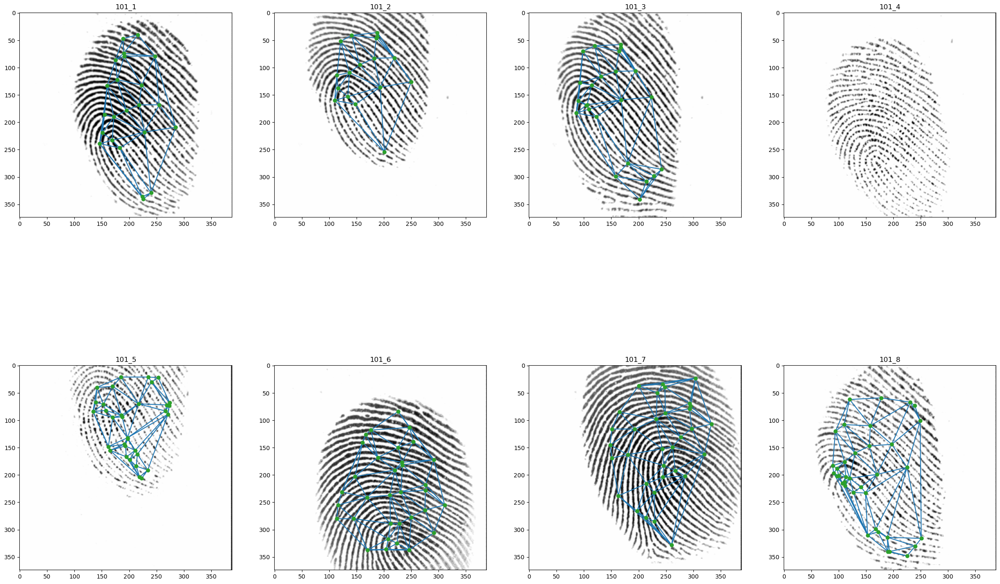

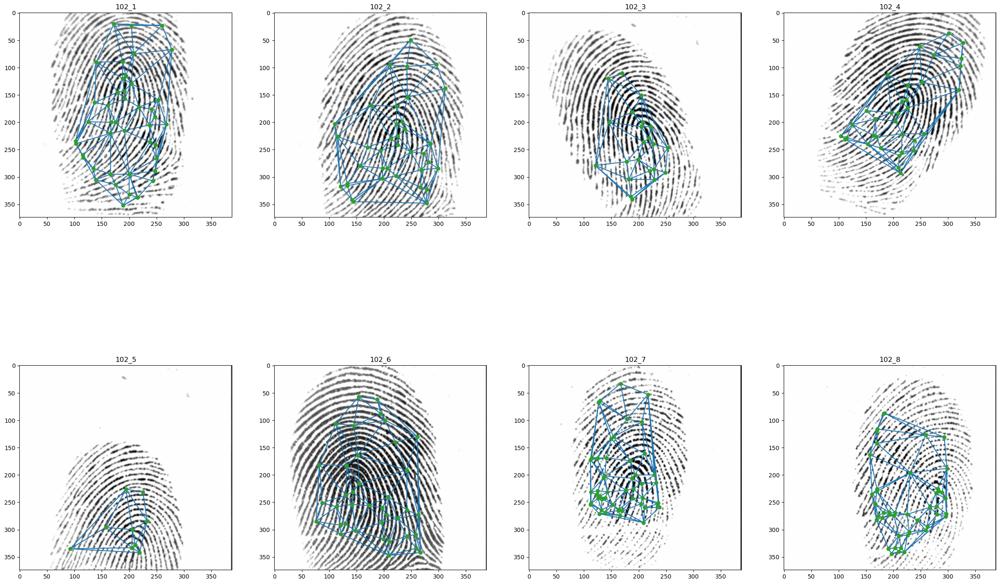

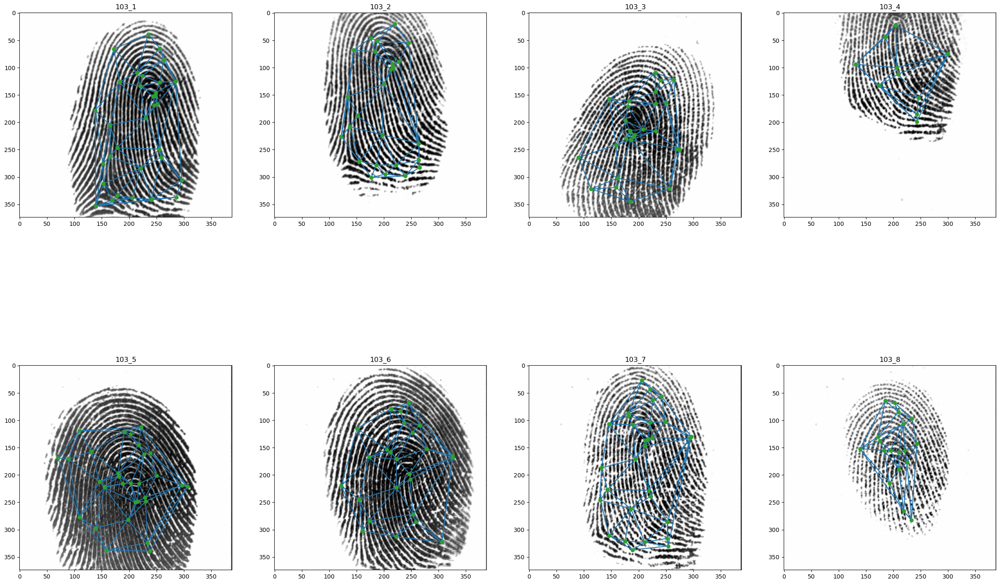

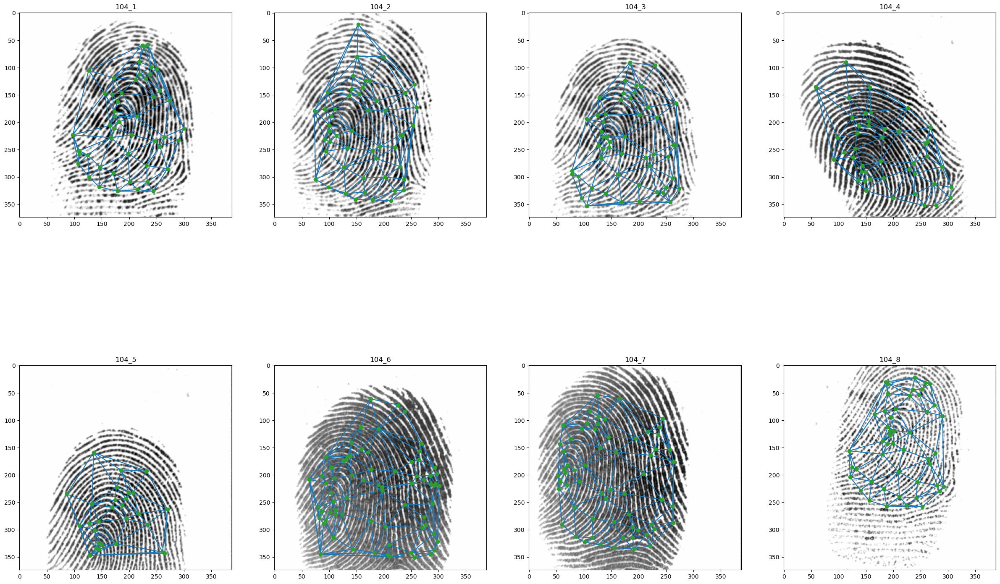

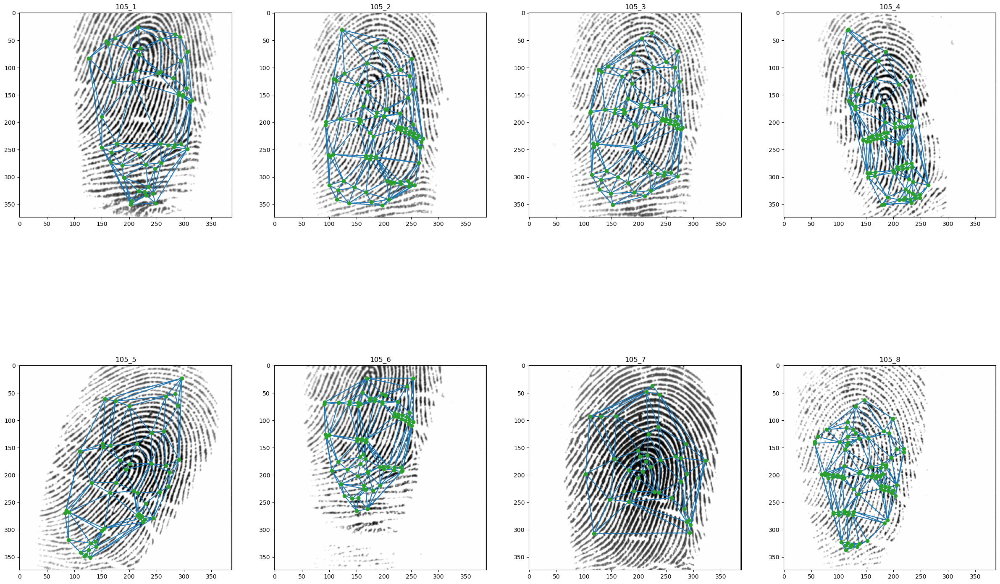

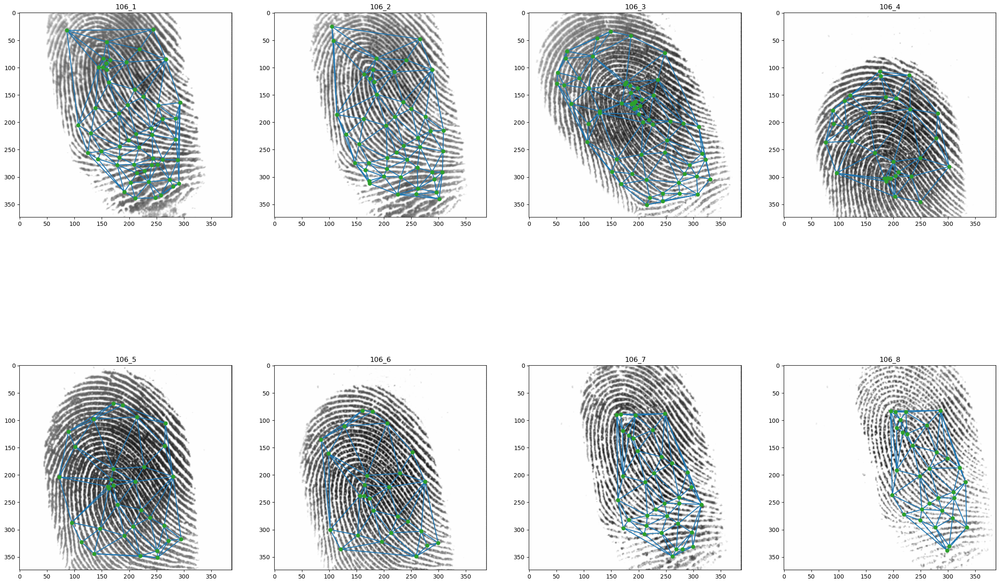

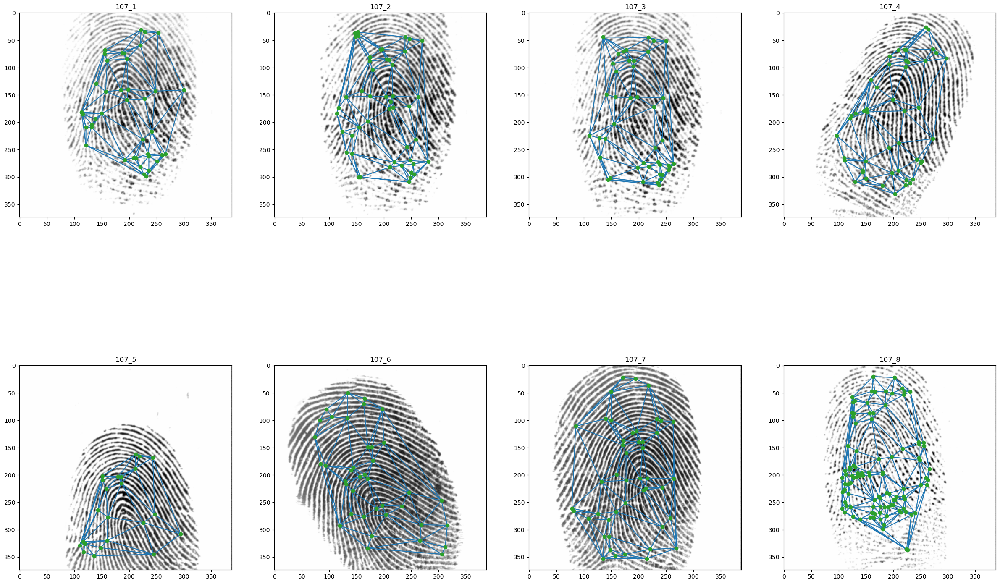

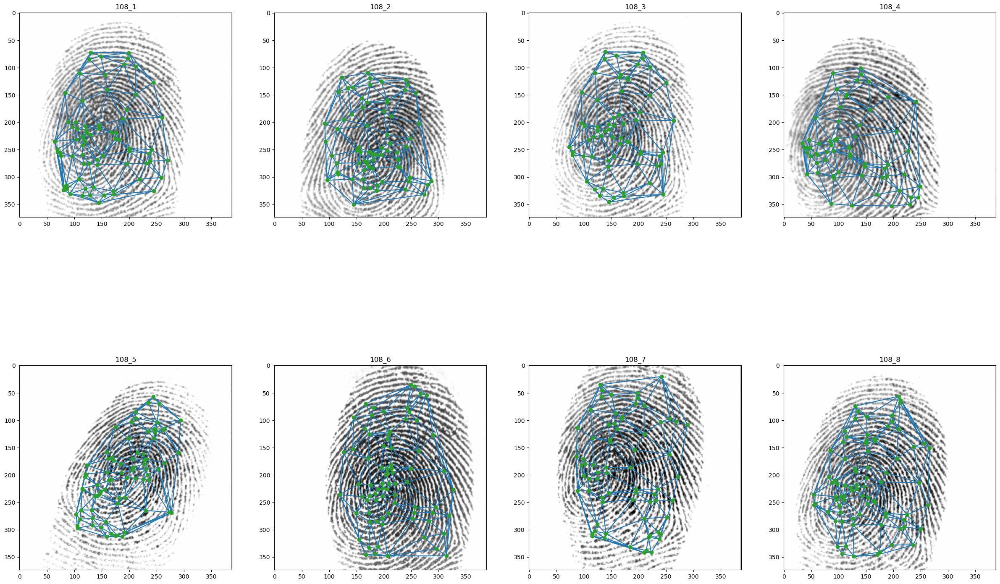

In [202]:
sub_db = all_sub_db[1]
for fid in all_fids:
    plot_delauny(fid,sub_db)
# fid = all_fids[1]
# plot_delauny(fid,sub_db)